## <u> Seoul Bike Sharing Demand Prediction</u>:

### Problem Statement:
- Currently Rental bikes are introduced in many urban cities for the enhancement of mobility comfort. It is important to make the rental bike available and accessible to the public at the right time as it lessens the waiting time. Eventually, providing the city with a stable supply of rental bikes becomes a major concern. The crucial part is the prediction of bike count required at each hour for the stable supply of rental bikes.

### Dataset Info:
- The dataset contains count of public bicycles rented per hour in the Seoul Bike Sharing System, with corresponding weather data and holiday information.
    * \# Instances- 8760
    * \# Features- 14
- The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.
(https://archive.ics.uci.edu/dataset/560/seoul+bike+sharing+demand)

- Features:
    * Date : year-month-day
    * Rented Bike count - Count of bikes rented at each hour
    * Hour - Hour of he day
    * Temperature-Temperature in Celsius
    * Humidity - %
    * Windspeed - m/s
    * Visibility - 10m
    * Dew point temperature - Celsius
    * Solar radiation - MJ/m2
    * Rainfall - mm
    * Snowfall - cm
    * Seasons - Winter, Spring, Summer, Autumn
    * Holiday - Holiday/No holiday
    * Functional Day - NoFunc(Non Functional Hours), Fun(Functional hours)
    
### Objectives:

- Understand the trends in the data and identify key factors affecting the hourly demand for rental bikes.
- Build an appropriate regression model to forecast the number of rental bikes required per hour.

## Data Understanding

In [95]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('dark')
plt.rcParams['figure.figsize'] = [12, 5] # default = [6.0, 4.0]
plt.rcParams['figure.dpi']     = 200     # default = 72.0

import warnings
warnings.filterwarnings('ignore')

In [92]:
data_path='../data/SeoulBikeData.csv'
graphs_path='../graphs'

In [19]:
##data loading
df = pd.read_csv(data_path, 
                encoding = "ISO-8859-1",
                parse_dates=['Date'],
                dayfirst=True)
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [27]:
print(('==')*40)
print(f'Number of instances: {df.shape[0]}')
print(f'Number of features: {df.shape[1]}')

Number of instances: 8760
Number of features: 14


In [28]:
print(('==')*40)
print('Dataset Info:')
print(df.info())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Date                       8760 non-null   datetime64[ns]
 1   Rented Bike Count          8760 non-null   int64         
 2   Hour                       8760 non-null   int64         
 3   Temperature(°C)            8760 non-null   float64       
 4   Humidity(%)                8760 non-null   int64         
 5   Wind speed (m/s)           8760 non-null   float64       
 6   Visibility (10m)           8760 non-null   int64         
 7   Dew point temperature(°C)  8760 non-null   float64       
 8   Solar Radiation (MJ/m2)    8760 non-null   float64       
 9   Rainfall(mm)               8760 non-null   float64       
 10  Snowfall (cm)              8760 non-null   float64       
 11  Seasons                    8760 non-null   object      

In [36]:
print('=='*40)
print('\033[1mMissing Values Count per feature:\033[0m')
print(df.isnull().sum())

Missing Values Count per feature:
Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64


In [38]:
duplicates=df.duplicated().sum()
print('=='*40)
print(f"Number of duplicate records: {duplicates}")

Number of duplicate records: 0


### Obseravations:
1) Total 14 features are available for analysis. 
    * Out of these 14 features, `Seasons`, `Holiday`, and `Functioning Day` are categorical features.
    * `Rented Bike Count` is a target feature.
    * `Date` is temporal feature.
    * While other features are numerical in nature.
3) There are neither null values nor duplicate records present in the dataset.

### Exploratory Data Analysis

In [47]:
## statistical summary
print('=='*40)
print("\033[1mStatistical summary of numerical features:\033[0m")
display(df.describe().T)

Statistical summary of numerical features:


,count,mean,std,min,25%,50%,75%,max
Rented Bike Count,8760.0,704.602055,644.997468,0.0,191.00,504.50,1065.25,3556.00
Hour,8760.0,11.500000,6.922582,0.0,5.75,11.50,17.25,23.00
Temperature(°C),8760.0,12.882922,11.944825,-17.8,3.50,13.70,22.50,39.40
Humidity(%),8760.0,58.226256,20.362413,0.0,42.00,57.00,74.00,98.00
Wind speed (m/s),8760.0,1.724909,1.036300,0.0,0.90,1.50,2.30,7.40
Visibility (10m),8760.0,1436.825799,608.298712,27.0,940.00,1698.00,2000.00,2000.00
Dew point temperature(°C),8760.0,4.073813,13.060369,-30.6,-4.70,5.10,14.80,27.20
Solar Radiation (MJ/m2),8760.0,0.569111,0.868746,0.0,0.00,0.01,0.93,3.52
Rainfall(mm),8760.0,0.148687,1.128193,0.0,0.00,0.00,0.00,35.00
Snowfall (cm),8760.0,0.075068,0.436746,0.0,0.00,0.00,0.00,8.80


In [59]:
print('=='*40)
print("\033[1mUnique Value Count of categorical features:\033[0m")
display(pd.DataFrame(df.select_dtypes(include='object').nunique()).reset_index().rename(columns={'index':'Feature', 0:'Count'}))

Unique Value Count of categorical features:


,Feature,Count
0,Seasons,4
1,Holiday,2
2,Functioning Day,2


In [63]:
num_cols = df.select_dtypes(exclude=['object', 'datetime64[ns]']).columns
cat_cols = df.select_dtypes(include='object').columns

In [64]:
num_cols

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')

### Target variable

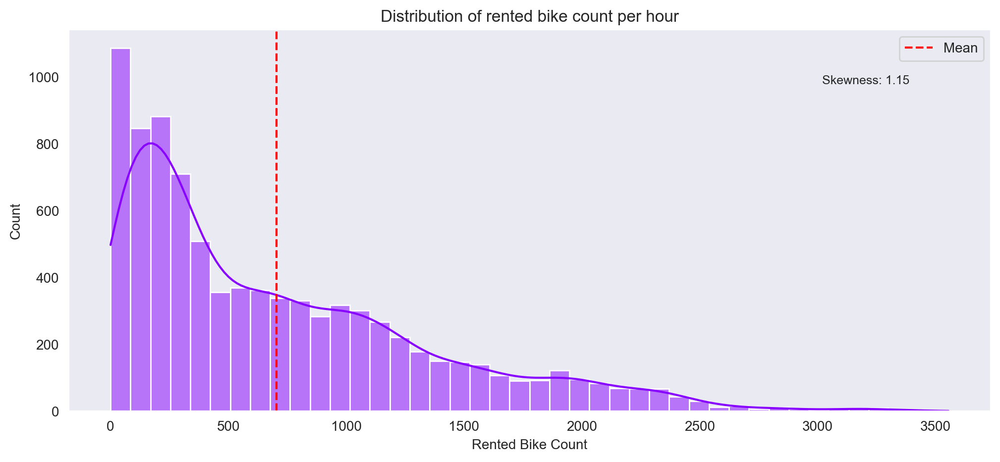

In [96]:
##exploring target feature
skewness = np.round(df['Rented Bike Count'].skew(),2)
mean = df['Rented Bike Count'].mean()
sns.histplot(data=df, x='Rented Bike Count', color='#8800ff', kde=True)
plt.axvline(x=mean, linestyle='--', color='r', label='Mean')
plt.title("Distribution of rented bike count per hour")
plt.text(x=3020, y=980, s=f'Skewness: {skewness}', fontsize=9)
plt.legend()
plt.savefig(os.path.join(graphs_path, 'distribution of target variable'))
plt.show()

**Observations:**
- Target feature is highly skewed (right-skewed).
- Appropriate transformation is required.

### Categorical Variables

In [97]:
cat_cols

Index(['Seasons', 'Holiday', 'Functioning Day'], dtype='object')

In [178]:
def cat_plot(col):
    
    print("=="*40)
    print(f'Summary of Rented bikes per hour for {col} column:')
    display(df.groupby(by=col)['Rented Bike Count'].agg(['count', 'mean', 'median', np.std, 'sum'] ))
    print("=="*40)
    print(f"Visualization of {col} column:")
    print('\n')
    
    plt.subplots(1,2)
    plt.subplot(121)
    plt.pie(
            x=df.groupby(by=col, sort=False)['Rented Bike Count'].sum().values,
            labels=df.groupby(by=col, sort=False)['Rented Bike Count'].sum().index,
            autopct='%.2f%%',
        colors=sns.color_palette('Set3')
        
            )
    plt.title(f"Percentage of rented bike count per hour for {col}")

    plt.subplot(122)
    sns.boxplot(data=df, x=col, y='Rented Bike Count', palette='Set3')
    plt.title(f"Distribution of rented bike count per {col}")

    fname=f"{col}"+"EDA" 
    plt.savefig(os.path.join(graphs_path, fname))
    plt.show()

#### Seasons

Summary of Rented bikes per hour for Seasons column:


,count,mean,median,std,sum
Seasons,,,,,
Autumn,2184,819.597985,763.5,651.085621,1790002
Spring,2208,730.031250,583.0,621.509635,1611909
Summer,2208,1034.073370,905.5,690.244759,2283234
Winter,2160,225.541204,203.0,150.372236,487169


Visualization of Seasons column:




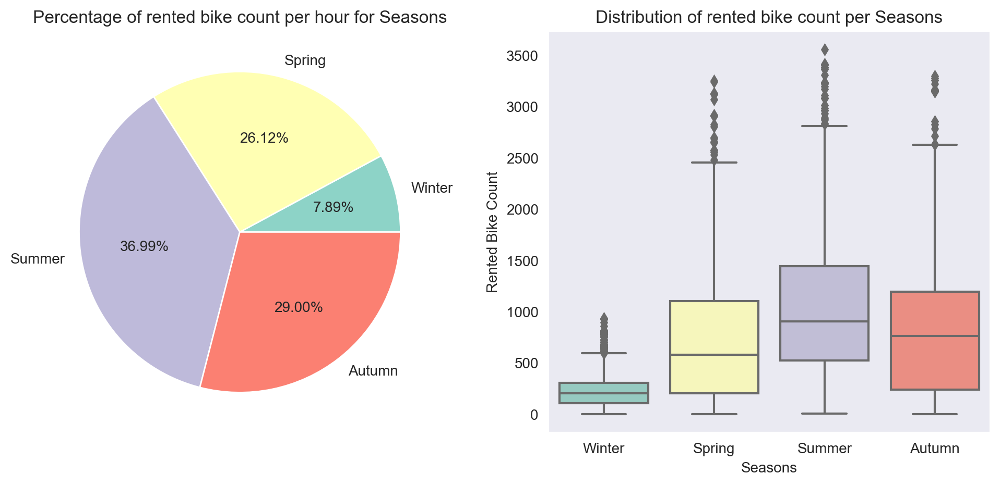

In [180]:
cat_plot('Seasons')

**Observations:**
- Data points are uniformaly distributed across all the seasons.
- The median Rented bike count for summer season is highest amoung all the seasons and minimum for winter season.
- Summer has the highest number of bikes rented, 37%.
- Winter however is the season where the least number of bikes are rented, 8%.

#### Holiday

Summary of Rented bikes per hour for Holiday column:


,count,mean,median,std,sum
Holiday,,,,,
Holiday,432,499.756944,240.0,570.772769,215895
No Holiday,8328,715.228026,524.5,646.879124,5956419


Visualization of Holiday column:




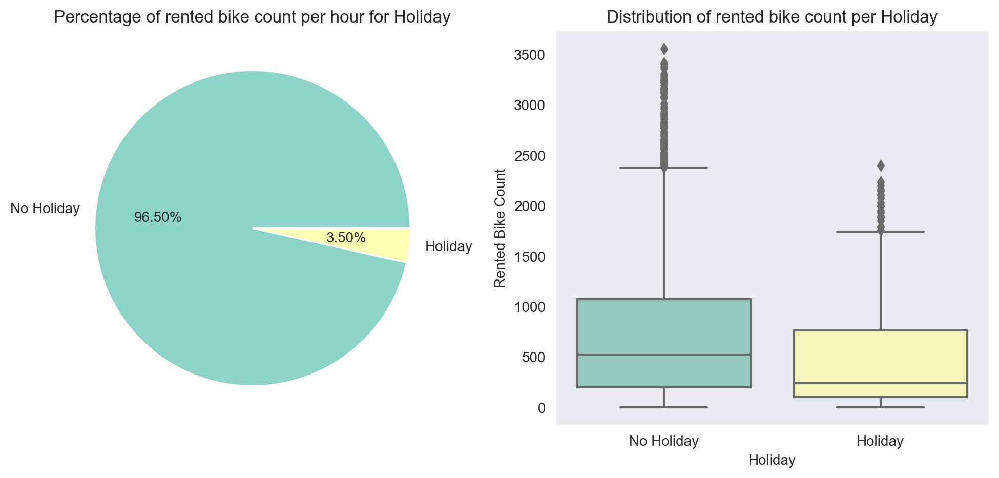

In [181]:
cat_plot('Holiday')

**Observations:**
- Majority of the bikes rented are on non-Holidays, almost 97%.

#### Functioning Day

Summary of Rented bikes per hour for Functioning Day column:


,count,mean,median,std,sum
Functioning Day,,,,,
No,295,0.000000,0.0,0.000000,0
Yes,8465,729.156999,542.0,642.351166,6172314


Visualization of Functioning Day column:




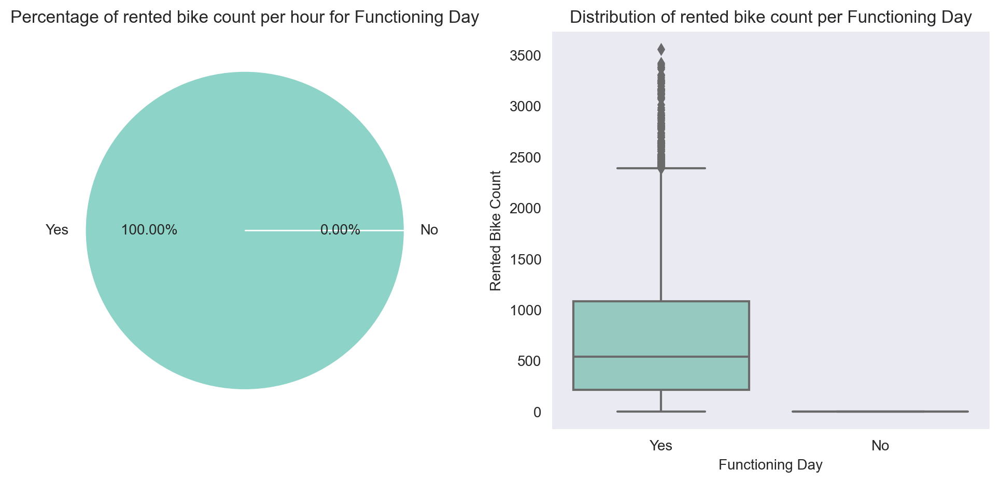

In [182]:
cat_plot('Functioning Day')

**Observations:**
- No bikes were rented on the non functioning day.
- Primarily, it seem that the feature `Functioning Day` ain't explaining of target variable.

### Numerical Variables

In [183]:
num_cols

Index(['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)'],
      dtype='object')

In [239]:
def discrete_plot(col):
    
    plt.subplots(1,3, figsize=(15,4))

    # Univariate analysis
    plt.subplot(131)
    count = sns.countplot(data=df, x=col)
    plt.title(f'Count Plot of {col}')

    # adding value count on the top of bar
    for i, p in enumerate(count.patches):
        plt.text(x=i, y=p.get_height(), s=p.get_height(), ha='center', va='top',rotation='vertical', fontsize=7)

    # Bi-variate analysis 
    # Rented Bike Count Vs Hour
    plt.subplot(132)
    bar = sns.barplot(data=df, x=col, y='Rented Bike Count')
    plt.xlabel(col)
    plt.ylabel('Rented Bike Count')
    plt.title(f'Rented Bike Count Vs {col}')

    # Multi-variate analysis
    plt.subplot(133)
    point = sns.pointplot(data=df, x=col, y='Rented Bike Count', hue='Holiday')
    plt.xlabel(col)
    plt.ylabel('Rented Bike Count')
    plt.title(f'Average Bike Rented Vs {col} with Holiday')

    fname=col+'EDA'
    plt.savefig(os.path.join(graphs_path, fname))

    plt.tight_layout()
    plt.show()

In [245]:
def continuous_plot(col):
    
    plt.subplots(1, 2)
    plt.subplot(121)
    sns.histplot(data=df, x=col, color='teal')
    plt.title(f'Distribution of {col}')

    plt.subplot(122)
    sns.regplot(data= df, x=col, y='Rented Bike Count', scatter_kws={"color": "c"}, line_kws={"color": "r"})
    plt.title(f'Regression of {col} on Rented Bike Count')
    
    if col == 'Wind speed (m/s)':
        col1 = 'Wind speed'
    elif col == 'Solar Radiation (MJ/m2)':
        col1='Solar Radiation'
    else:
        col1=col
        
        
    fname=col1+'EDA_1'
    plt.savefig(os.path.join(graphs_path, fname))
    plt.show()
    
    sns.lineplot(x=col, y="Rented Bike Count",data=df)
    plt.title(f'{col} vs Rented Bike Count ')
    
    fname=col1+'EDA_2'
    plt.savefig(os.path.join(graphs_path, fname))
    plt.show()

#### Hour

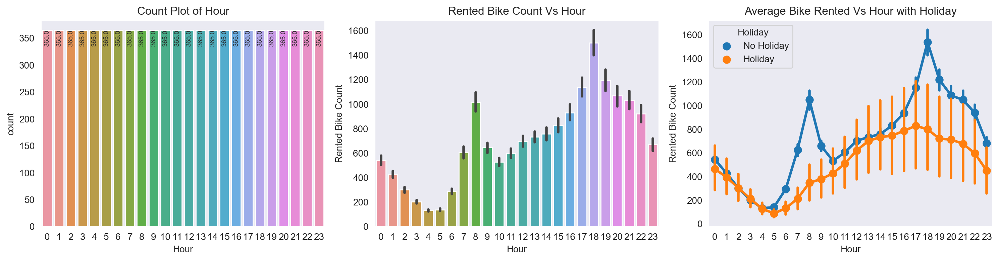

In [240]:
discrete_plot('Hour')

- Every hour has an equal number of counts in the dataset.
- Demand for rented bike count is higher at 8 AM and 6 PM indicating a high demand during business hours.
- Rented Bike Count follows 2 patterns one for holiday and another for no holiday.
- Non-Holidays: The pattern showsthat there are peaks in the rentals at around 8 am and another at around 6 pm. These correspond to local bikers who typically go to work on a working day, Monday to Friday.
- Holidays: Second pattern shows that the rentals are more or less uniform across the day with a peak at around noon time.

#### Temperature(°C)

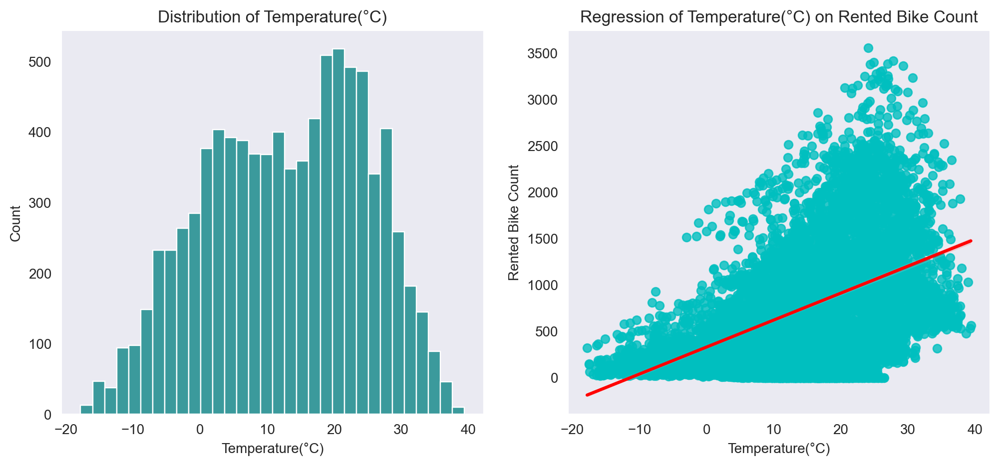

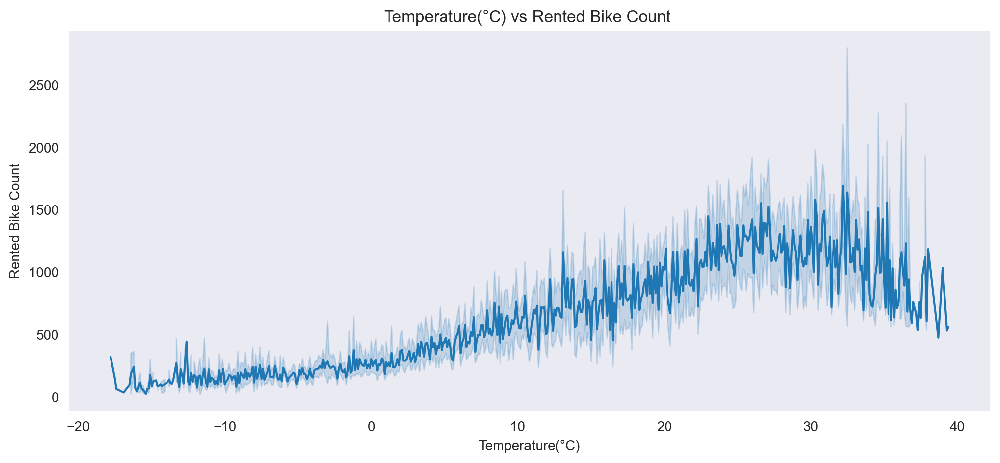

In [238]:
continuous_plot('Temperature(°C)')

**Observations:**
- The plot above shows that the average number of bikes rented with temperature increases steadily, with a slight decrease at the highest temperature.
- People prefer renting bikes in warm environments. Therefore, the demand for bicycles is high if the temperature is sufficiently warm, but extremely hot temperatures are also unsuitable for bike demand.
- However, there is a slight decrease in count if the temperature is too high (the darkest of the blue dots).

#### Humidity(%)

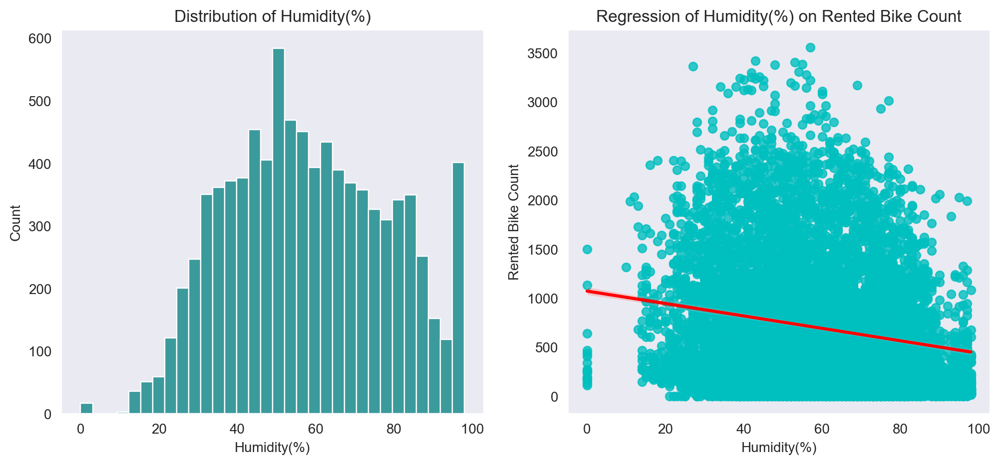

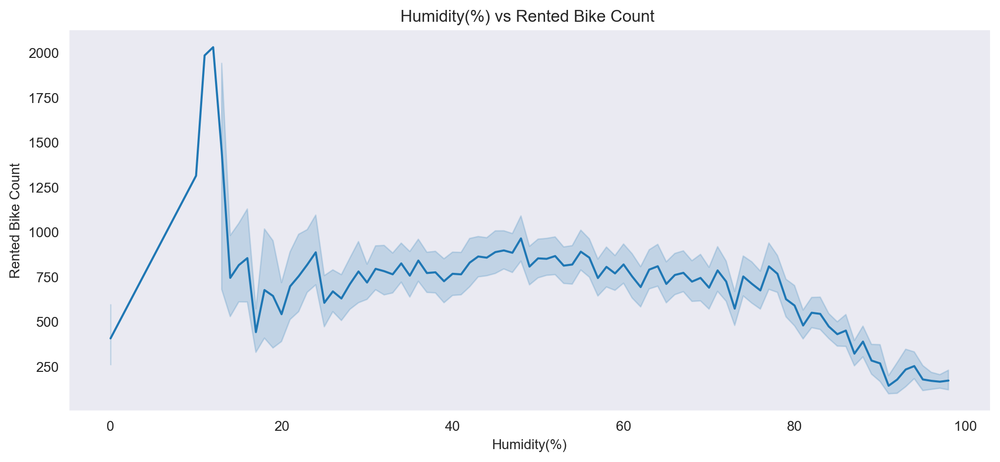

In [242]:
continuous_plot('Humidity(%)')

**Observations:**
- The plots shows that the average number of bikes rented goes up and down sharply with the peak at around 50. 
- For the number of rented bikes in demand, the most preferred humid environment is 20-80.

#### Wind speed (m/s)

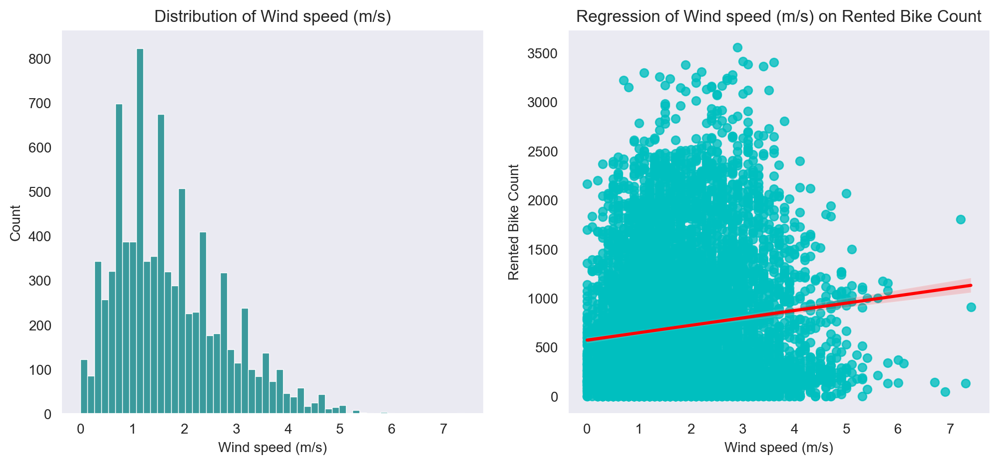

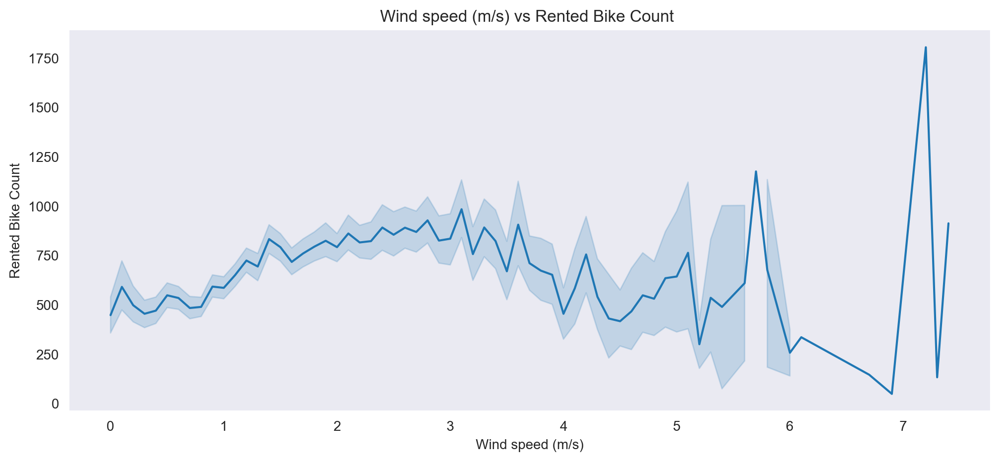

In [246]:
continuous_plot('Wind speed (m/s)')

**Observations:**
- Wind speed is slightly right skewed.
- For the wind speed upto 4 m/s, as the wind speed increases rented bike count increases.
- However, the rented bike count decreases as the Wind speed goes above 5m/s.
- Line plot shows the peak at wind speed 7m/s. It implies that there may be outliers.

#### Visibility (10m)

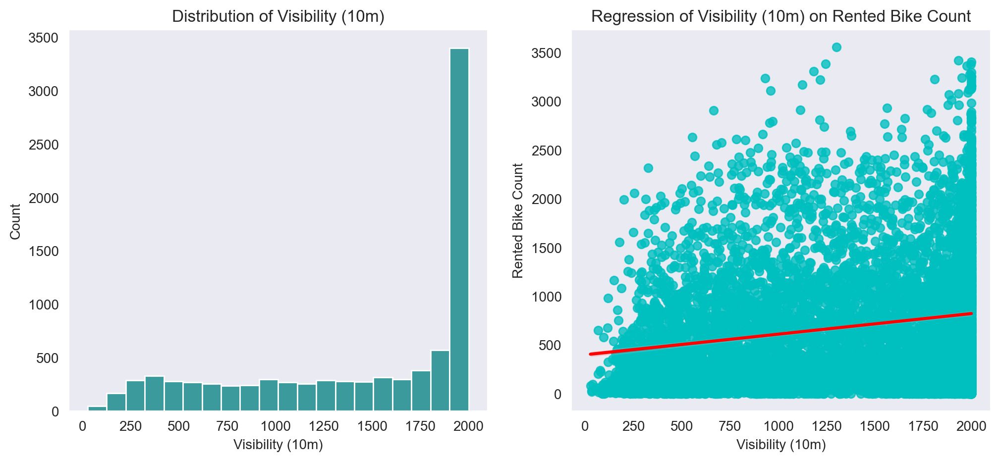

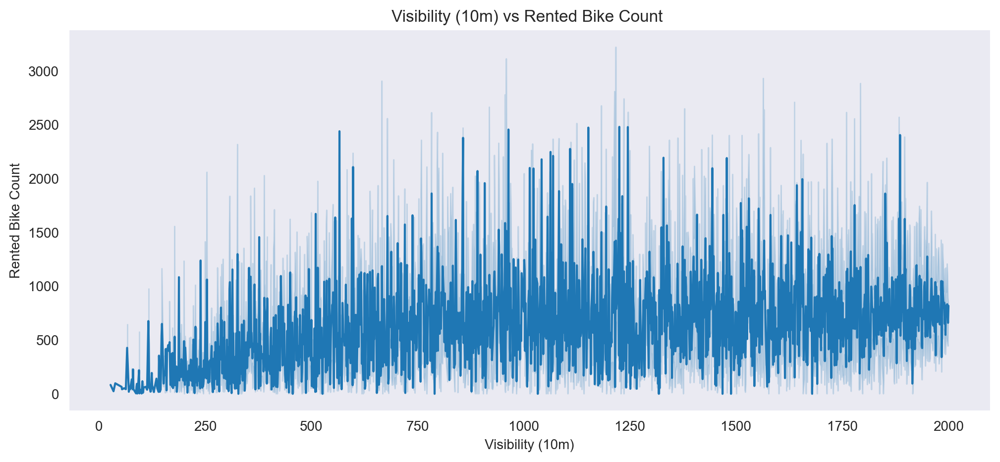

In [247]:
continuous_plot('Visibility (10m)')

**Observations:**
- Visibility is highly skewed to the left side.
- We can see from these plots above that as visibility rises, so does rented_bike_count.

#### Dew point temperature(°C)

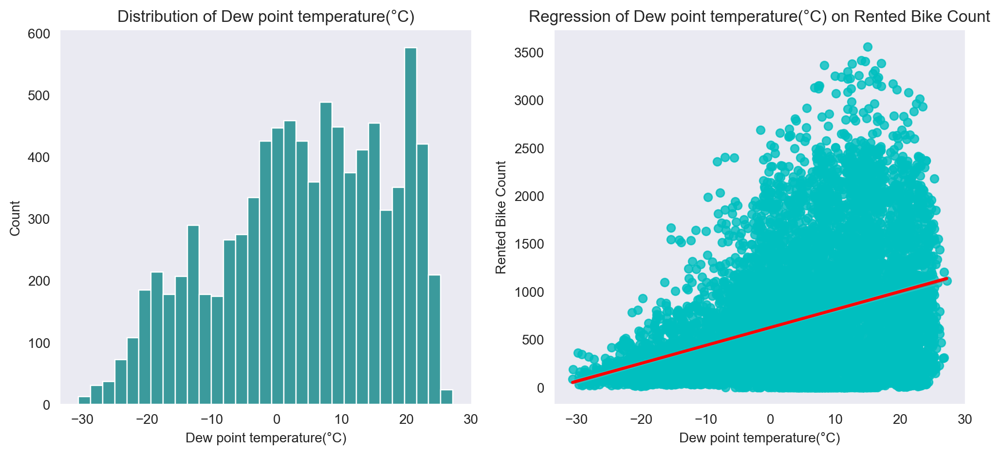

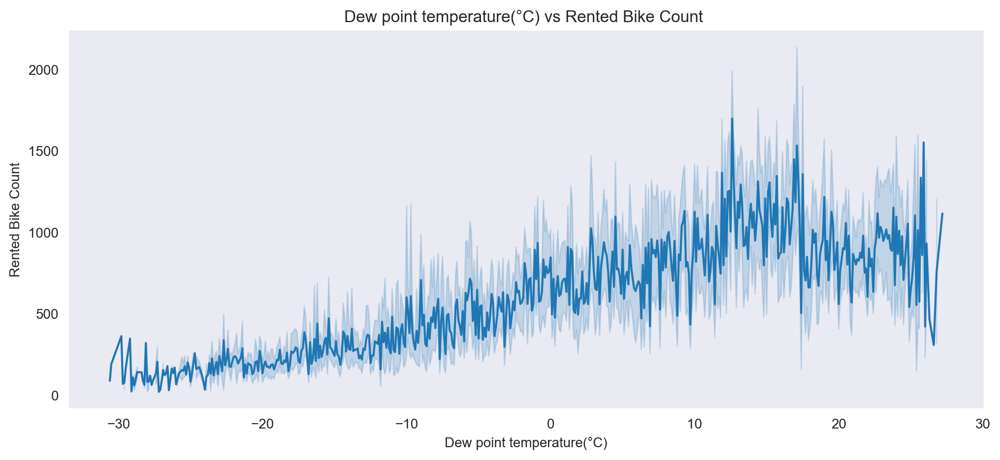

In [248]:
continuous_plot('Dew point temperature(°C)')

**Observations:**
- The plot shows a clear positive relationship of dew point temperature with rented bike count.
- The average number of bikes rented with dew point temperature increases steadily, with a slight decrease at the highest dew point temperature.

#### Solar Radiation (MJ/m2)

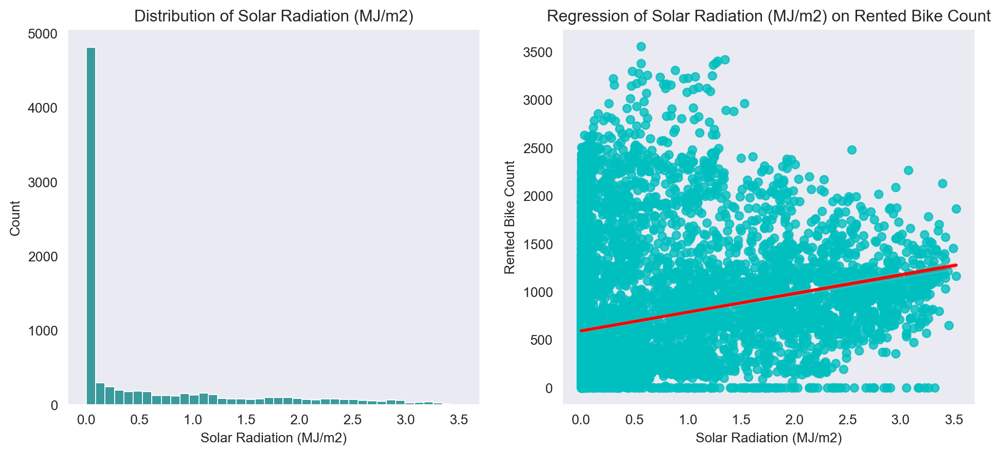

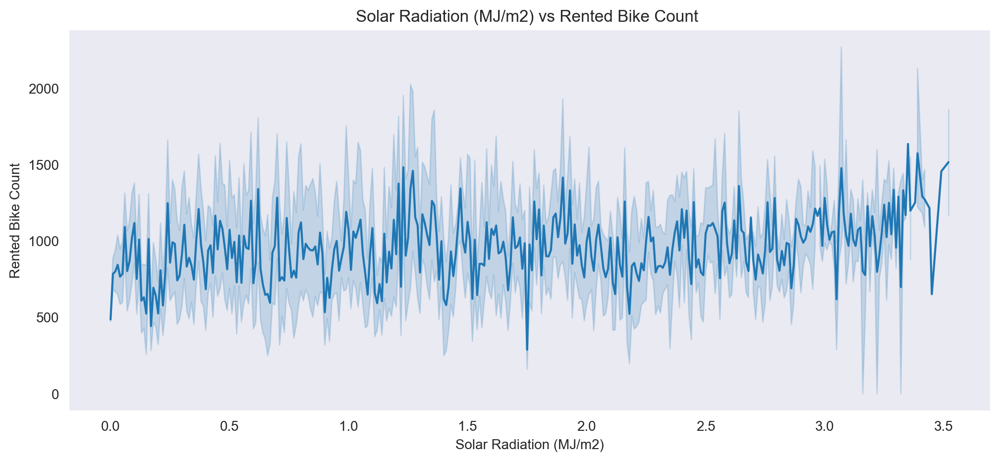

In [249]:
continuous_plot('Solar Radiation (MJ/m2)')

**Observations:**
- Solar radiation column is highly skewed to positive.
- The average number of bikes rented goes up with solar radiation.
- Additionally, this column is directly related to the temperature column.

#### Rainfall(mm)

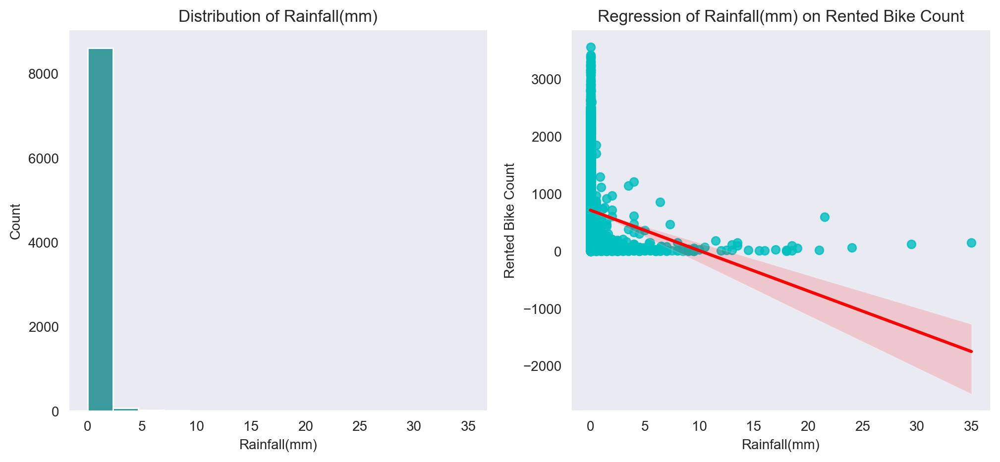

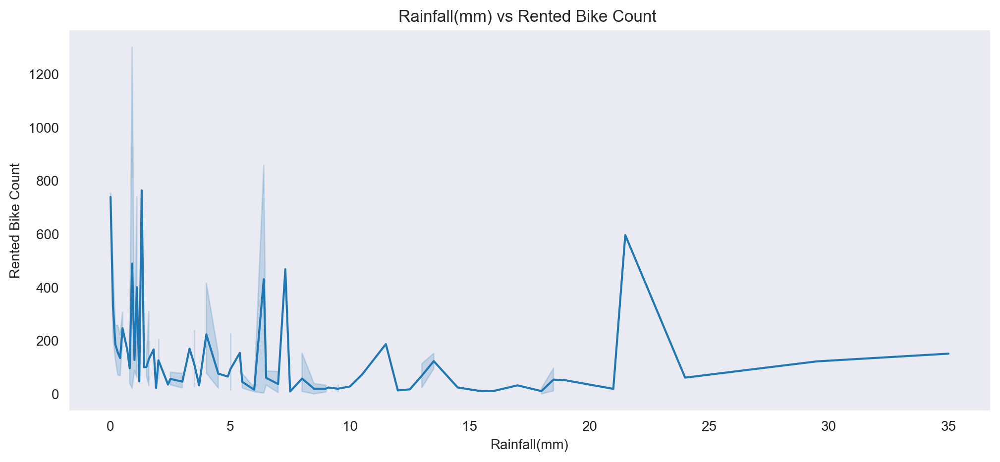

In [250]:
continuous_plot('Rainfall(mm)')

**Observations:**
- Rainfall feature is right skewed.
- There exists a negative relationship between ranfall and rented bike count

#### Snowfall (cm)

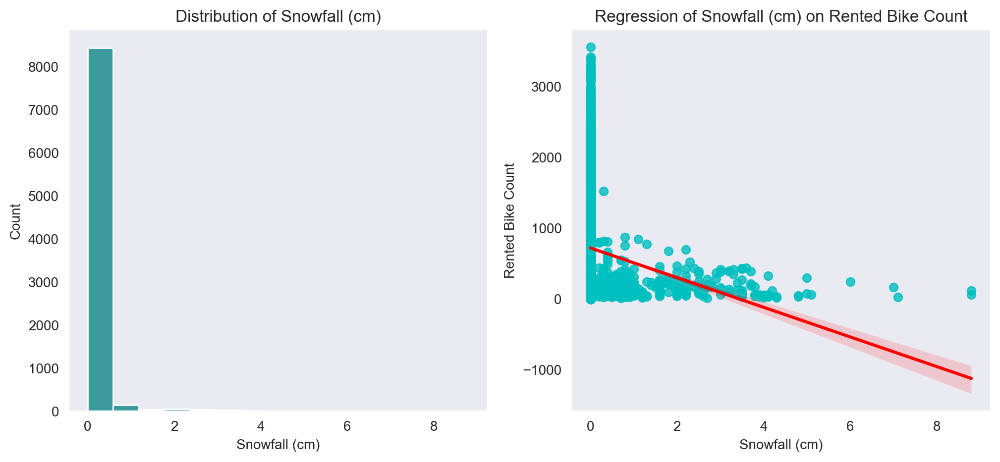

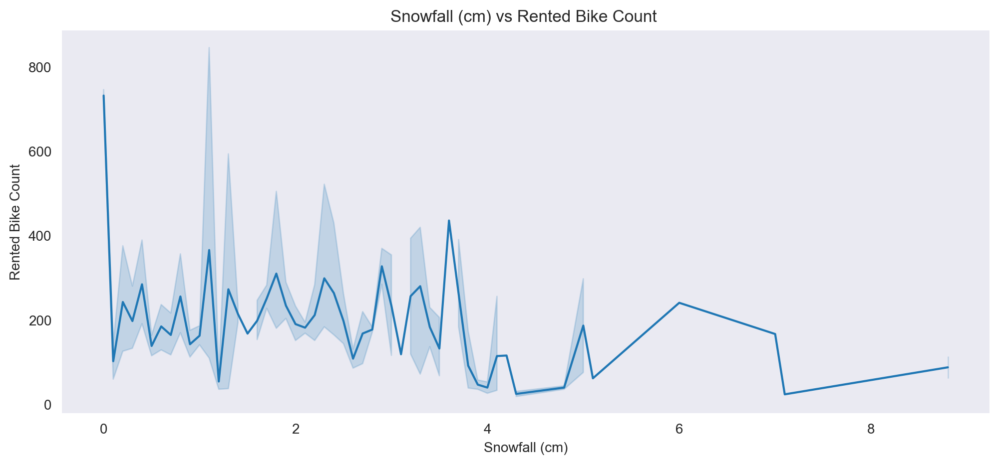

In [251]:
continuous_plot('Snowfall (cm)')

**Observations:**
- Snowfall feature is right skewed.
- There exists a negative relationship between ranfall and rented bike count

### Temporal Variables

In [263]:
## Extracting temporal features
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month_name()
df['day'] = df['Date'].dt.day
df['week_day'] = df['Date'].dt.day_name()
df['working_day'] = (df['Date'].dt.dayofweek < 5).astype(int)

time_cols = ['year', 'month', 'day', 'week_day', 'working_day']
df.loc[:,['Rented Bike Count', 'Date']+time_cols].head()

,Rented Bike Count,Date,year,month,day,week_day,working_day
0,254,2017-12-01,2017,December,1,Friday,1
1,204,2017-12-01,2017,December,1,Friday,1
2,173,2017-12-01,2017,December,1,Friday,1
3,107,2017-12-01,2017,December,1,Friday,1
4,78,2017-12-01,2017,December,1,Friday,1


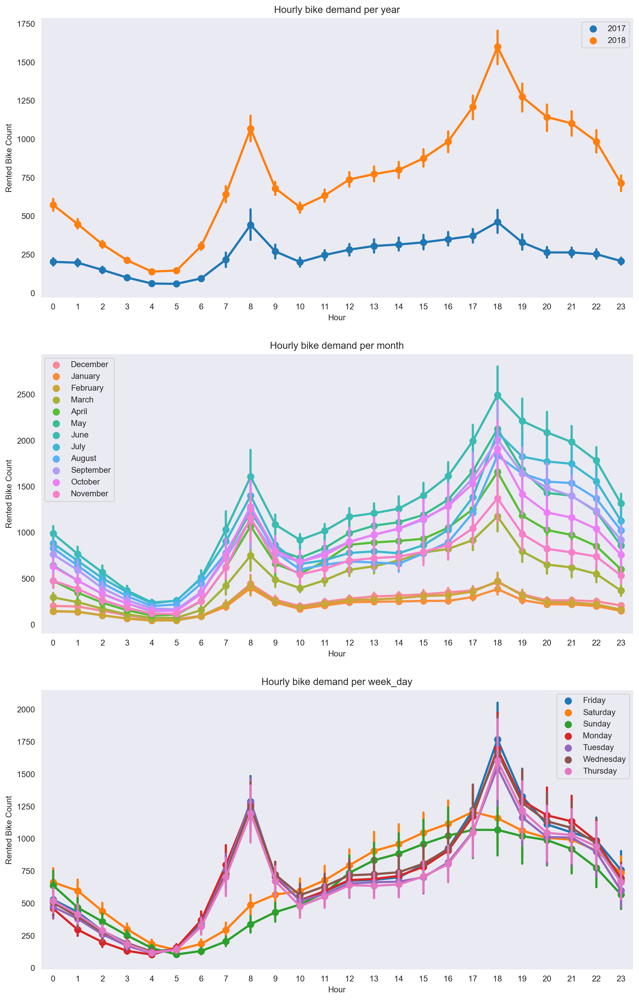

In [275]:
plt.subplots(3,1, figsize=(13,21))

plt.subplot(311)
sns.pointplot(data=df, x='Hour', y='Rented Bike Count', hue='year')
plt.ylabel("Rented Bike Count")
plt.xlabel("Hour")
plt.title('Hourly bike demand per year')
plt.legend()

plt.subplot(312)
sns.pointplot(data=df, x='Hour', y='Rented Bike Count', hue='month')
plt.ylabel("Rented Bike Count")
plt.xlabel("Hour")
plt.title('Hourly bike demand per month')
plt.legend()

plt.subplot(313)
sns.pointplot(data=df, x='Hour', y='Rented Bike Count', hue='week_day')
plt.ylabel("Rented Bike Count")
plt.xlabel("Hour")
plt.title('Hourly bike demand per week_day')
plt.legend()

fname='TemporalEDA'

plt.savefig(os.path.join(graphs_path, fname))
plt.show()

**Observations:**
- In December, January & February the demand for rented bike is lowest.
- On weekend almost throught the day there is low demand compared to week days.

### Correlation

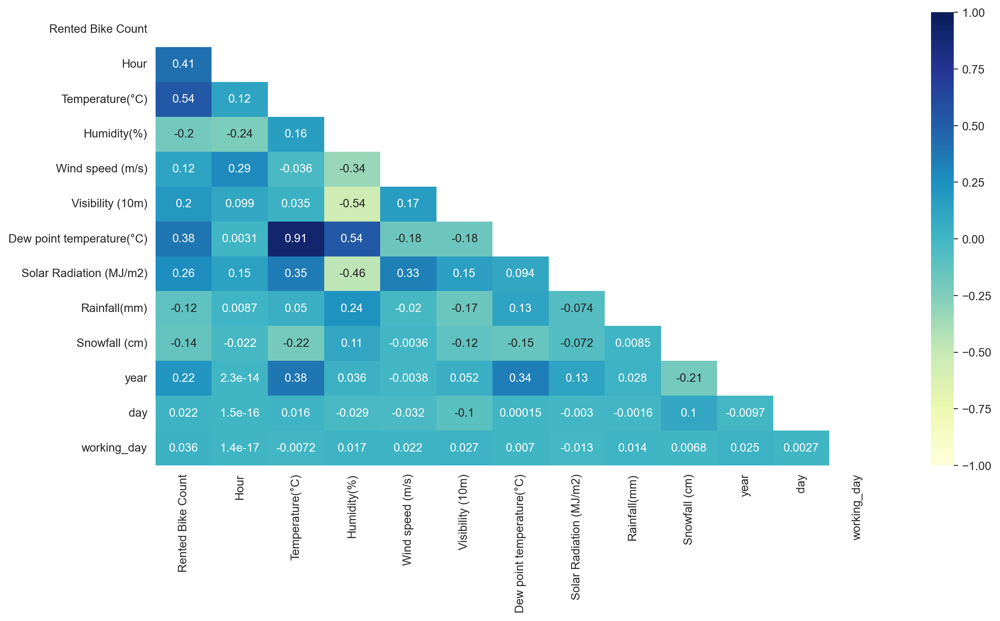

In [278]:
# Correlation Heatmap visualization code
corr = df.corr()
mask = np.zeros_like(corr)

mask[np.triu_indices_from(mask)] = True

with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(14,7))
    ax = sns.heatmap(corr , mask=mask, vmin = -1,vmax=1, annot = True, cmap="YlGnBu")
    plt.savefig(os.path.join(graphs_path, 'correlationmap'))
    plt.show()

**Observations:**
- Tigh multicolinearity is evident between independent variable (i.e temperature & dew point temp, humidity & dew point temp, weekend & day of week).
- There is correlation of temperature, hour, dew point temp & solar radiation with dependent variable rented bike.

### Pairplot

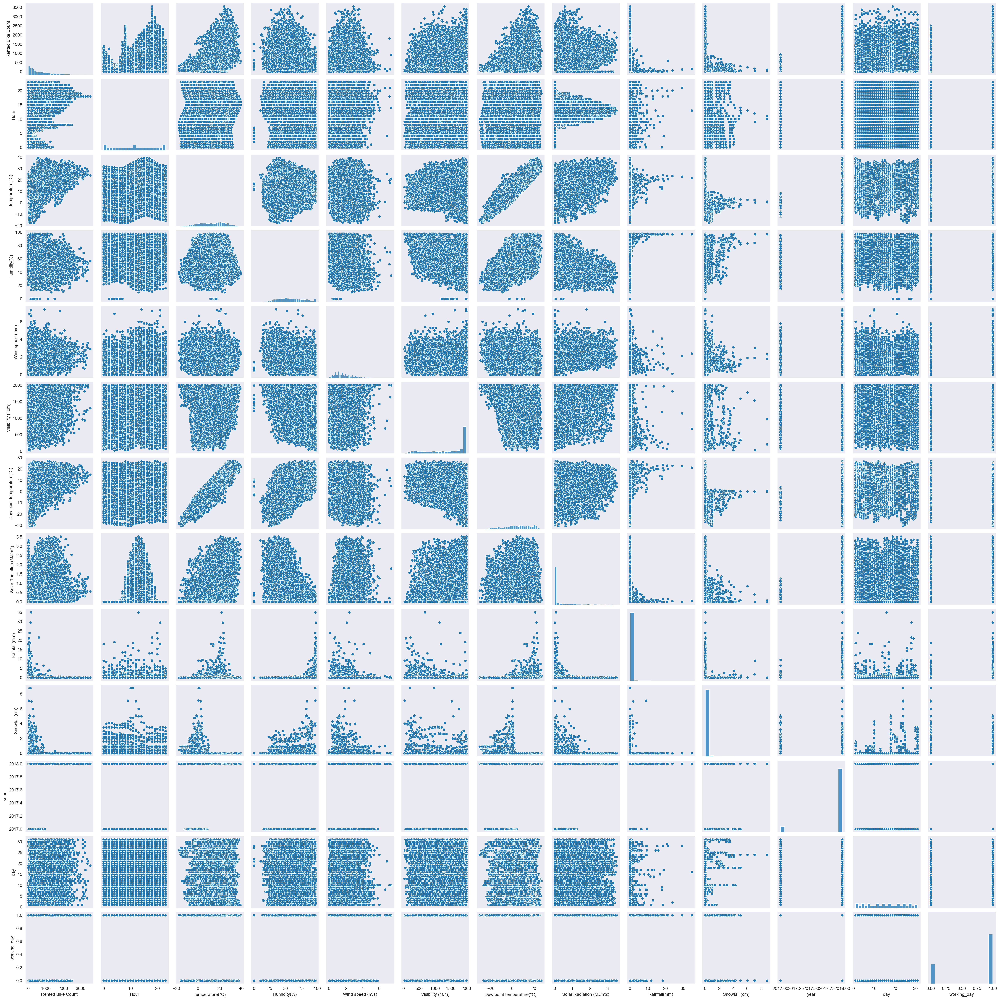

In [279]:
# Pair Plot visualization code
sns.pairplot(df)
plt.savefig(os.path.join(graphs_path, 'pairplot'))
plt.show()

**Observations:**
- The pair plot shows that, the linear relationship between variables is not clear. other than dew point temp, temperature & solar radiation there is not any relationship.


#### Skewness

In [286]:
print('=='*40)
print('Skewness of each feature:')
print('\n')
print(df.skew().sort_values(ascending=False))

Skewness of each feature:


Rainfall(mm)                 14.533232
Snowfall (cm)                 8.440801
Solar Radiation (MJ/m2)       1.504040
Rented Bike Count             1.153428
Wind speed (m/s)              0.890955
Humidity(%)                   0.059579
day                           0.007522
Hour                          0.000000
Temperature(°C)              -0.198326
Dew point temperature(°C)    -0.367298
Visibility (10m)             -0.701786
working_day                  -0.953097
year                         -2.978262
dtype: float64


## Feature Engineering

### Removing skewness - Applying Transformation

In [287]:
# For positively skewed data
df['Rented Bike Count_sqrt']=(df['Rented Bike Count']+1).transform(np.sqrt)
df['Wind speed (m/s)_log']=(df['Wind speed (m/s)']+1).transform(np.log)
df['Solar Radiation (MJ/m2)_log']=(df['Solar Radiation (MJ/m2)']+1).transform(np.log)

# For negatively skewed data
df['Visibility (10m)_sqrt']=(max(df['Visibility (10m)']+1)-df['Visibility (10m)']).transform(np.sqrt)

# For large skewed data
df['Rainfall(mm)_log']=(df['Rainfall(mm)']+1).transform(np.log)
df['Snowfall (cm)_log']=(df['Snowfall (cm)']+1).transform(np.log)

In [288]:
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),...,month,day,week_day,working_day,Rented Bike Count_sqrt,Wind speed (m/s)_log,Solar Radiation (MJ/m2)_log,Visibility (10m)_sqrt,Rainfall(mm)_log,Snowfall (cm)_log
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,December,1,Friday,1,15.968719,1.163151,0.0,1.0,0.0,0.0
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,...,December,1,Friday,1,14.317821,0.587787,0.0,1.0,0.0,0.0
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,...,December,1,Friday,1,13.190906,0.693147,0.0,1.0,0.0,0.0
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,...,December,1,Friday,1,10.392305,0.641854,0.0,1.0,0.0,0.0
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,...,December,1,Friday,1,8.888194,1.193922,0.0,1.0,0.0,0.0


In [298]:
num_cols = list(num_cols)
num_cols.remove('Rented Bike Count')
num_cols

['Hour',
 'Temperature(°C)',
 'Humidity(%)',
 'Wind speed (m/s)',
 'Visibility (10m)',
 'Dew point temperature(°C)',
 'Solar Radiation (MJ/m2)',
 'Rainfall(mm)',
 'Snowfall (cm)']

### Removing skewness - Clipping Outliers

In [299]:
# we are going to replace the datapoints with upper and lower bound of all the outliers
for col in num_cols:
    # using IQR method to define range of upper and lower limit.
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # replacing the outliers with upper and lower bound
    df[col+'_clipped'] = df[col].clip(lower_bound, upper_bound)
df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),...,Snowfall (cm)_log,Hour_clipped,Temperature(°C)_clipped,Humidity(%)_clipped,Wind speed (m/s)_clipped,Visibility (10m)_clipped,Dew point temperature(°C)_clipped,Solar Radiation (MJ/m2)_clipped,Rainfall(mm)_clipped,Snowfall (cm)_clipped
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,...,0.0,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,...,0.0,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,...,0.0,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,...,0.0,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,...,0.0,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0


In [302]:
df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day', 'year', 'month', 'day', 'week_day',
       'working_day', 'Rented Bike Count_sqrt', 'Wind speed (m/s)_log',
       'Solar Radiation (MJ/m2)_log', 'Visibility (10m)_sqrt',
       'Rainfall(mm)_log', 'Snowfall (cm)_log', 'Hour_clipped',
       'Temperature(°C)_clipped', 'Humidity(%)_clipped',
       'Wind speed (m/s)_clipped', 'Visibility (10m)_clipped',
       'Dew point temperature(°C)_clipped', 'Solar Radiation (MJ/m2)_clipped',
       'Rainfall(mm)_clipped', 'Snowfall (cm)_clipped'],
      dtype='object')

In [310]:
target_variable=['Rented Bike Count']

transformed_target=['Rented Bike Count_sqrt']

og_cols=['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day']

transformed = ['Date','Rented Bike Count_sqrt', 'Hour', 'Temperature(°C)', 'Humidity(%)',
               'Wind speed (m/s)_log', 'Visibility (10m)_sqrt','Dew point temperature(°C)',
               'Solar Radiation (MJ/m2)_log', 'Rainfall(mm)_log', 'Snowfall (cm)_log', 'Seasons',
                'Holiday', 'Functioning Day']


clipped = ['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)_clipped', 'Humidity(%)_clipped',
           'Wind speed (m/s)_clipped', 'Visibility (10m)_clipped', 'Dew point temperature(°C)_clipped',
           'Solar Radiation (MJ/m2)_clipped', 'Rainfall(mm)_clipped', 'Snowfall (cm)_clipped', 'Seasons',
           'Holiday', 'Functioning Day']

derived_features=['year', 'month', 'day', 'week_day']

In [316]:
og_df = df[og_cols+derived_features]
og_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day,week_day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday


In [317]:
transformed_df = df[transformed+derived_features]
transformed_df.head()

,Date,Rented Bike Count_sqrt,Hour,Temperature(°C),Humidity(%),Wind speed (m/s)_log,Visibility (10m)_sqrt,Dew point temperature(°C),Solar Radiation (MJ/m2)_log,Rainfall(mm)_log,Snowfall (cm)_log,Seasons,Holiday,Functioning Day,year,month,day,week_day
0,2017-12-01,15.968719,0,-5.2,37,1.163151,1.0,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
1,2017-12-01,14.317821,1,-5.5,38,0.587787,1.0,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
2,2017-12-01,13.190906,2,-6.0,39,0.693147,1.0,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
3,2017-12-01,10.392305,3,-6.2,40,0.641854,1.0,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
4,2017-12-01,8.888194,4,-6.0,36,1.193922,1.0,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday


In [318]:
clipped_df =df[clipped+derived_features]
clipped_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C)_clipped,Humidity(%)_clipped,Wind speed (m/s)_clipped,Visibility (10m)_clipped,Dew point temperature(°C)_clipped,Solar Radiation (MJ/m2)_clipped,Rainfall(mm)_clipped,Snowfall (cm)_clipped,Seasons,Holiday,Functioning Day,year,month,day,week_day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday


In [323]:
og_df.to_csv(os.path.join('../data', 'bike-data.csv'), header=True, index=False)
transformed_df.to_csv(os.path.join('../data', 'transformed-bike-data.csv'), header=True, index=False)
clipped_df.to_csv(os.path.join('../data', 'clipped-bike-data.csv'), header=True, index=False)

### Removing Multicolinearity

In [521]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
def compute_vif(X, column=None):
    
    cols = X.select_dtypes(exclude=['datetime64[ns]', 'object']).columns  
    X = X.loc[:, cols]

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    vif = vif.sort_values(by='VIF', ascending=False).reset_index(drop=True)
    return(vif)

In [514]:
def remove_multicolinearity(df, thresh=5):
    
    """
    Computes vif and removes the multicolinearity based on vif value
    
    Input : 
        df      pandas dataframe
                a data frame to remove multicolinearity
        thresh: int/float
                threshold of vif
                all the columns above threshold will be removed
    Returns:
        vif:    pandas dataframe
                a dataframe with variable names along with respective vif values
        
        columns: list
                list of features that must be dropped to remove multicolinearity
    
    
    """
    
    thresh=thresh
    cols_to_drop = []
    
    vif = compute_vif(df)
    
    for i in range(len(vif)):
        val = vif.loc[0, 'VIF']
        
        if val > thresh:
            col=vif.loc[0, 'variables']
            cols_to_drop.append(col)
            temp_df = df.drop(columns=cols_to_drop)
            vif = compute_vif(temp_df, column=cols_to_drop)
        else:
            break
    return vif, cols_to_drop

In [528]:
og_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,year,month,day,week_day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,2017,December,1,Friday


In [565]:
X_og = og_df.drop(columns=['Date', 'Rented Bike Count', 'week_day'])
_, cols = remove_multicolinearity(X_og)

print('=='*40)
print('Columns Causing Multicolinearity:')
print(cols)

X_og = og_df.drop(columns=cols + ['Date', 'Rented Bike Count', 'week_day'])
X_og.to_csv(os.path.join('../data', 'original-independent-vars.csv'), header=True, index=False)

Columns Causing Multicolinearity:
['year', 'Temperature(°C)', 'Humidity(%)']


In [566]:
X_transformed = transformed_df.drop(columns=['Date', 'Rented Bike Count_sqrt', 'week_day'])
_, cols = remove_multicolinearity(X_transformed)

print('=='*40)
print('Columns Causing Multicolinearity:')
print(cols)

X_transformed = transformed_df.drop(columns=cols + ['Date', 'Rented Bike Count_sqrt', 'week_day'])
X_transformed.to_csv(os.path.join('../data', 'transformed-independent-vars.csv'), header=True, index=False)

Columns Causing Multicolinearity:
['year', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)_log']


In [567]:
X_clipped = clipped_df.drop(columns=['Date', 'Rented Bike Count', 'week_day'])
_, cols = remove_multicolinearity(X_clipped)

print('=='*40)
print('Columns Causing Multicolinearity:')
print(cols)

X_clipped = clipped_df.drop(columns=cols + ['Date', 'Rented Bike Count', 'week_day'])
X_clipped.to_csv(os.path.join('../data', 'clipped-independent-vars.csv'), header=True, index=False)

Columns Causing Multicolinearity:
['year', 'Temperature(°C)_clipped', 'Humidity(%)_clipped']


In [568]:
target_df= pd.concat([df[target_variable], df[transformed_target]], axis=1)
target_df.to_csv(os.path.join('../data', 'dependent-variable.csv'), header=True, index=False)

### Feature Encoding and Scaling

In [1]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

def feature_scale_encode(df):
    seasons   = ['Spring', 'Summer', 'Autumn', 'Winter']
    holidays  = ['No Holiday', 'Holiday']
    functional= ['No', 'Yes']
    month     = ['January', 'February', 'March', 'April', 'May', 'June','July', 'August', 'September', 'October', 'November','December']

    oe=OrdinalEncoder(categories=[seasons, holidays, functional, month])
    sc=StandardScaler()

    oe_cols = ['Seasons', 'Holiday', 'Functioning Day', 'month']

    sc_cols = list(df.select_dtypes(exclude='object').columns)
    sc_cols.remove('Hour')
    sc_cols.remove('day')

    ct = ColumnTransformer(transformers=[
                                            ('ordinal', oe, oe_cols),
                                            ('StandardScaler', sc, sc_cols)
                                        ],
                          remainder='passthrough')
    return ct

### Train-Test Split

In [2]:
from sklearn.model_selection import train_test_split

def train_test_split_enc(X, y, test_size=0.2,random_state=42):
    x_train, x_test, y_train, y_test = train_test_split(X, y,
                                                       test_size=test_size,
                                                       random_state=random_state)
    ct = feature_scale_encode()
    
    ct.fit(x_train)
    x_train = ct.transform(x_train)
    x_test = ct.transform(x_test)
    
    
    print('=='*40)
    print(f'Train set size = {x_train.shape}')
    print(f'Test set size = {x_test.shape}')
    
    return (x_train,y_train), (x_test, y_test)